In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ihelon/football-player-segmentation")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/football-player-segmentation


In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, metrics
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import ModelCheckpoint
import json

# Image Processing Libraries
import cv2
from cv2 import imread, resize
from scipy.ndimage import label, find_objects
from PIL import Image, ImageDraw

# Data Handling Libraries
import numpy as np
import pandas as pd
import random
from sklearn.model_selection import train_test_split

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# File and Operating System Libraries
import os

# Warnings Management
import warnings
warnings.filterwarnings('ignore')

# GPU Configuration
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
print(tf.config.list_physical_devices('GPU'))

INPUT_SIZE = (1920, 1080)
IMG_SIZE = 512
N = 512
path = ''
image_path = os.path.join(path, '/kaggle/input/football-player-segmentation/images/')
mask_path = os.path.join(path, '/kaggle/input/football-player-segmentation/annotations/')

with open('/kaggle/input/football-player-segmentation/annotations/instances_default.json') as f:
    annotations = json.load(f)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [ ]:
image_id_dict = {image['id']: image['file_name'] for image in annotations['images']}
images = np.zeros((N, IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)


for img_id, img_filename in image_id_dict.items():
    img = Image.open(os.path.join(image_path, img_filename))
    img = img.resize((IMG_SIZE, IMG_SIZE))  
    images[img_id - 1] = np.array(img)  

masks = np.zeros((N, IMG_SIZE, IMG_SIZE), dtype=bool)

for annotation in annotations['annotations']:
    img_id = annotation['image_id']
    mask = Image.new('1', INPUT_SIZE )  
    mask_draw = ImageDraw.ImageDraw(mask, '1')
    segmentation = annotation['segmentation'][0]
    mask_draw.polygon(segmentation, fill=1)
    bool_array = np.array(mask.resize((IMG_SIZE, IMG_SIZE))) > 0
    masks[img_id - 1] = masks[img_id - 1] | bool_array

# Plot Footbal Player Mask

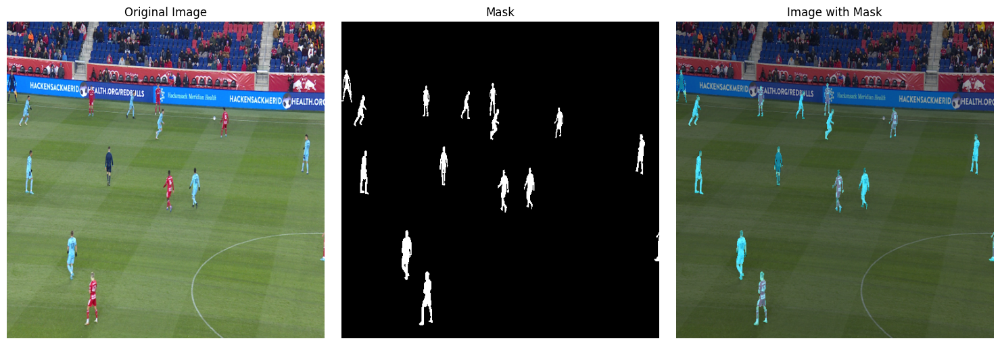

In [ ]:
def get_colored_mask(image, mask_image, color=[0, 244, 252]):
  
    if mask_image.ndim == 3:
        mask_image_gray = mask_image[:, :, 0]
    else:
        mask_image_gray = mask_image
    
    mask_image_uint8 = (mask_image_gray > 0).astype(np.uint8) * 255
    
    mask = np.zeros_like(image)
    mask_coord = np.where(mask_image_uint8 > 0)
    mask[mask_coord[0], mask_coord[1], :] = color  

    ret = cv2.addWeighted(image, 0.6, mask, 0.4, 0)
    return ret

filenames = list(image_id_dict.values())[:5]
for idx, file in enumerate(filenames):
    img = images[idx]
    msk = masks[idx]

    plt.figure(figsize=(15, 5))

    plt.subplot(131)
    plt.imshow(img)
    plt.title('Original Image')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)

    plt.subplot(132)
    plt.imshow(msk.squeeze(), cmap='binary_r')
    plt.title('Mask')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)

    plt.subplot(133)
    plt.imshow(get_colored_mask(img, msk))
    plt.title('Image with Mask')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)

    plt.tight_layout()
    plt.show()


# Data Generator

In [ ]:
def get_mask_from_annotations(image_id, annotations):
    mask = np.zeros((INPUT_SIZE[1], INPUT_SIZE[0]), dtype=np.uint8)
    for annotation in annotations['annotations']:
        if annotation['image_id'] == image_id:  
            segmentation = annotation['segmentation'][0] 
            poly = np.array(segmentation).reshape((-1, 2))
            cv2.fillPoly(mask, [poly.astype(np.int32)], color=1)
    return mask

class DataGenerator(keras.utils.Sequence):
    def __init__(self, img_files, annotations, images, batch_size=8, size=(512, 512), shuffle=True):
        self.img_files = img_files
        self.annotations = annotations
        self.images = images
        self.batch_size = batch_size
        self.size = size
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.img_files))
        if self.shuffle:
            self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.img_files) / self.batch_size))

    def __getitem__(self, index):
        batch_indices = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        images, masks = [], []

        for idx in batch_indices:
            img_filename = self.img_files[idx]
            img_id = list(image_id_dict.values()).index(img_filename) + 1
            img = self.images[img_id - 1]
            img = img / 255.0  # Normalize to [0, 1]

            mask = get_mask_from_annotations(img_id, self.annotations)

            mask_resized = cv2.resize(mask, self.size, interpolation=cv2.INTER_NEAREST)

            mask_array = np.expand_dims(mask_resized, axis=-1)

            images.append(img)
            masks.append(mask_array)

        return np.array(images), np.array(masks)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)


img_files = list(image_id_dict.values())  
msk_files = [get_mask_from_annotations(image['id'], annotations) for image in annotations['images']]  

train_val_img_files, test_img_files, train_val_msk_files, test_msk_files = train_test_split(img_files, msk_files, test_size=0.1, random_state=1)

train_img_files, val_img_files, train_msk_files, val_msk_files = train_test_split(train_val_img_files, train_val_msk_files, test_size=0.2, random_state=1)

train_data = DataGenerator(train_img_files, annotations=annotations, images=images, batch_size=8, size=(512, 512))
val_data = DataGenerator(val_img_files, annotations=annotations, images=images, batch_size=8, size=(512, 512))
test_data = DataGenerator(test_img_files, annotations=annotations, images=images, batch_size=8, size=(512, 512), shuffle=False)

In [7]:
print("Number of training images:", len(train_data.img_files))
print("Number of validation images:", len(val_data.img_files))
print("Number of test images:", len(test_data.img_files))

Number of training images: 368
Number of validation images: 92
Number of test images: 52


# U-Net

In [8]:
def unet(input_shape, num_classes):
    # Input layer for the model
    inputs = layers.Input(shape=input_shape)

    # Encoder Path
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = layers.Dropout(0.1)(c1)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = layers.Dropout(0.1)(c2)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = layers.Dropout(0.2)(c3)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = layers.Dropout(0.2)(c4)
    c4 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = layers.Dropout(0.3)(c5)
    c5 = layers.Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Expansive Path
    u6 = layers.Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = layers.Dropout(0.2)(c6)
    c6 = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = layers.Dropout(0.2)(c7)
    c7 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = layers.Dropout(0.1)(c8)
    c8 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1], axis=3)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = layers.Dropout(0.1)(c9)
    c9 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

     # Output layer for segmentation
    outputs = layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(c9)

    # Create the model
    model = models.Model(inputs=[inputs], outputs=[outputs])
    return model  # Return the model

# Instantiate the model
input_shape = (512, 512, 3)  # Define the input shape for grayscale images
model = unet(input_shape, 1)  # Create U-Net model for binary segmentation

# Print the model summary
model.summary() 

I0000 00:00:1745217152.873577      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745217152.874335      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 512, 512, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 512, 512, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512, 512, 64)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 512, 512, 64)   │         36,928 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 256, 256, 64)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 256, 256, 128)  │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 256, 256, 128)  │        147,584 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 128, 128, 128)  │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 256)  │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 128, 128, 256)  │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 128, 128, 256)  │        590,080 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 64, 64, 256)    │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 64, 64, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 64, 64, 512)    │              0 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 64, 64, 512)    │      2,359,808 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 32, 32, 512)    │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)    

 Total params: 31,031,745 (118.38 MB)

 Trainable params: 31,031,745 (118.38 MB)

 Non-trainable params: 0 (0.00 B)

# Evaluation Metrics

In [9]:
# Jaccard Index Metric
def jaccard_index(y_true, y_pred):
    """Calculates the Jaccard index (IoU), useful for evaluating the model's performance."""
    y_true_f = tf.reshape(tf.cast(y_true, tf.float32), [-1])  # Flatten and cast ground truth
    y_pred_f = tf.reshape(tf.cast(y_pred, tf.float32), [-1])  # Flatten and cast predictions
    intersection = tf.reduce_sum(y_true_f * y_pred_f)  # Compute intersection
    total = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection  # Total pixels
    return (intersection) / (total)


def dice_coefficient(y_true, y_pred):
    # Flatten and cast true and predicted masks to float32
    y_true_f = tf.reshape(tf.cast(y_true, tf.float32), [-1])  # Flatten and cast y_true to float32
    y_pred_f = tf.reshape(tf.cast(y_pred, tf.float32), [-1])  # Flatten and cast y_pred to float32
    
    # Calculate the intersection between the true and predicted masks
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    
    # Calculate the Dice coefficient using the formula
    return (2. * intersection) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f))


# Using the metrics in model compilation
model.compile(optimizer='adam', 
              loss='binary_crossentropy', 
              metrics=['accuracy',dice_coefficient,jaccard_index])

# Train the model

In [10]:
# ModelCheckpoint: Save the model with the best validation loss during training
checkpoint = ModelCheckpoint(
    'best_model.keras',            # Path to save the model
    monitor='val_dice_coefficient',         # Metric to monitor 
    verbose=1,                  # Print messages when saving the model
    save_best_only=True,        # Save only the best model (with highest metric)
    mode='max',                 # 'max' means the model with the highest metric score will be saved
    save_weights_only=False,     # Save the entire model (not just weights)
)

# Fit the model with multi-processing enabled
history = model.fit(
    train_data,                  # The training data generator or dataset
    validation_data=val_data,  # Validation data ratio 
    epochs=50,              # Number of epochs
    callbacks=[checkpoint],# Callbacks for checkpoint and early stopping
)

Epoch 1/50


I0000 00:00:1745217164.842120      98 service.cc:148] XLA service 0x7ce40c0267b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745217164.843007      98 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745217164.843044      98 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1745217165.836585      98 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-04-21 06:32:51.670725: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[8,64,512,512]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,64,512,512]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":fa

46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8813 - dice_coefficient: 0.0216 - jaccard_index: 0.0110 - loss: 3.0124

2025-04-21 06:36:23.896760: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[8,64,512,512]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,64,512,512]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2025-04-21 06:36:24.956923: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.060334024s
Trying algorithm eng0{} for conv (f32[8,64,512,512]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,64,512,512]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config=


Epoch 1: val_dice_coefficient improved from -inf to 0.01438, saving model to best_model.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 272s 3s/step - accuracy: 0.8826 - dice_coefficient: 0.0215 - jaccard_index: 0.0109 - loss: 2.9764 - val_accuracy: 0.9806 - val_dice_coefficient: 0.0144 - val_jaccard_index: 0.0072 - val_loss: 0.1166
Epoch 2/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9816 - dice_coefficient: 0.0161 - jaccard_index: 0.0081 - loss: 0.1114
Epoch 2: val_dice_coefficient improved from 0.01438 to 0.02661, saving model to best_model.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.9816 - dice_coefficient: 0.0162 - jaccard_index: 0.0082 - loss: 0.1114 - val_accuracy: 0.9806 - val_dice_coefficient: 0.0266 - val_jaccard_index: 0.0135 - val_loss: 0.1065
Epoch 3/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9816 - dice_coefficient: 0.0725 - jaccard_index: 0.0405 - loss: 0.0906
Epoch 3: val_dice_coefficient improved from 0.02661 to 0.59934, saving model to best_mode

# Save Model

In [11]:
from tensorflow.keras.models import load_model

model = load_model(
    '/kaggle/working/best_model.keras',
    custom_objects={'dice_coefficient': dice_coefficient, 'jaccard_index': jaccard_index}
)
model.save('/kaggle/working/best_model.keras')

# Plot training and validation results

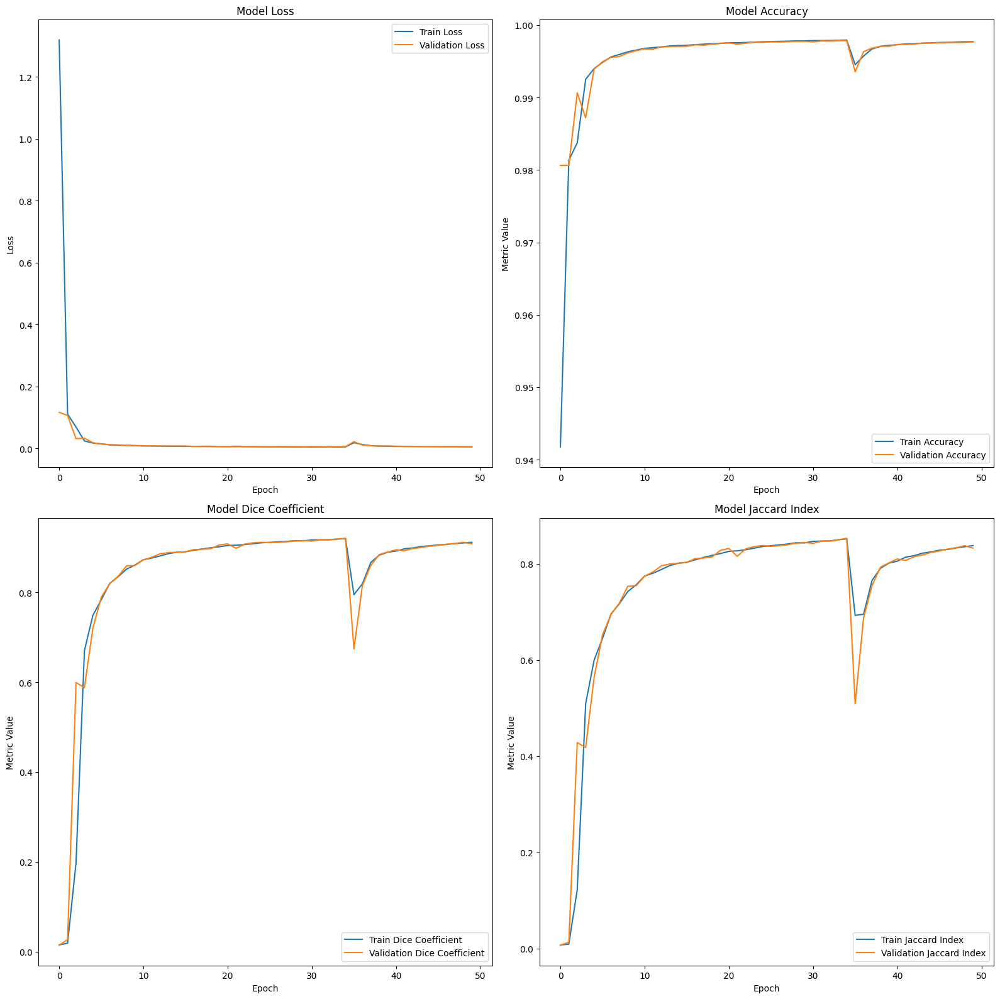

In [13]:
# Plot training & validation loss values
plt.figure(figsize=(16,16))
plt.subplot(221)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

# Plot training & validation accuracy values
plt.subplot(222)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Model Accuracy')
plt.ylabel('Metric Value')
plt.xlabel('Epoch')

# Plot training & validation dice coefficient values
plt.subplot(223)
plt.plot(history.history['dice_coefficient'], label='Train Dice Coefficient')
plt.plot(history.history['val_dice_coefficient'], label='Validation Dice Coefficient')
plt.legend(loc='lower right')
plt.title('Model Dice Coefficient')
plt.ylabel('Metric Value')
plt.xlabel('Epoch')

# Plot training & validation jaccard index values
plt.subplot(224)
plt.plot(history.history['jaccard_index'], label='Train Jaccard Index')
plt.plot(history.history['val_jaccard_index'], label='Validation Jaccard Index')
plt.legend(loc='lower right')
plt.title('Model Jaccard Index')
plt.ylabel('Metric Value')
plt.xlabel('Epoch')

plt.tight_layout()
plt.show()

# Visualize Segmentation Output

# Plot test results

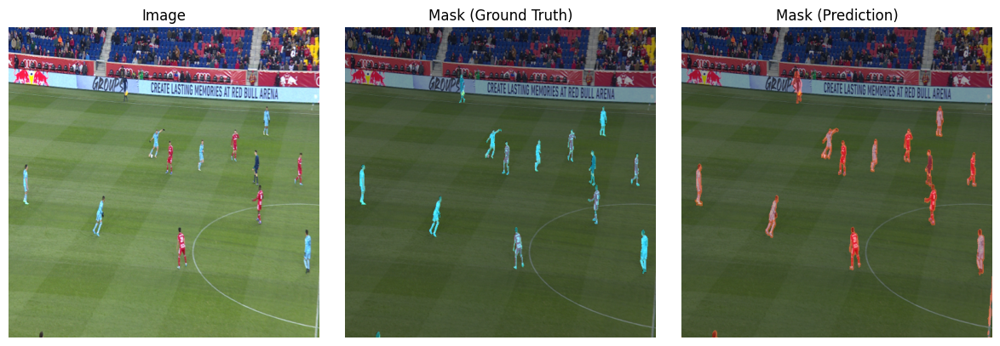

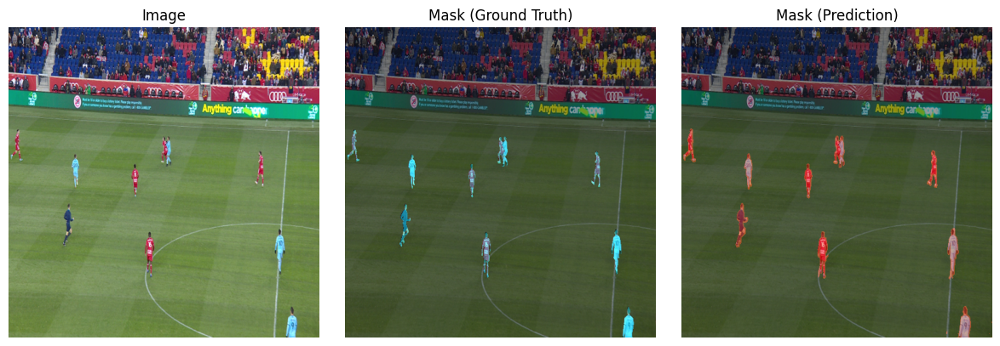

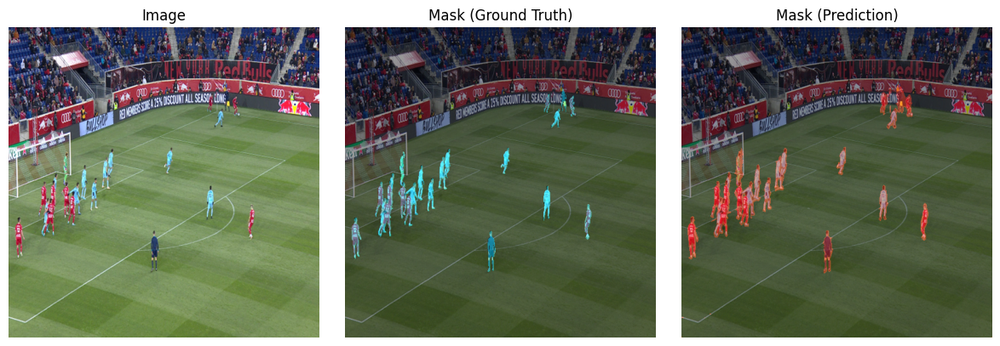

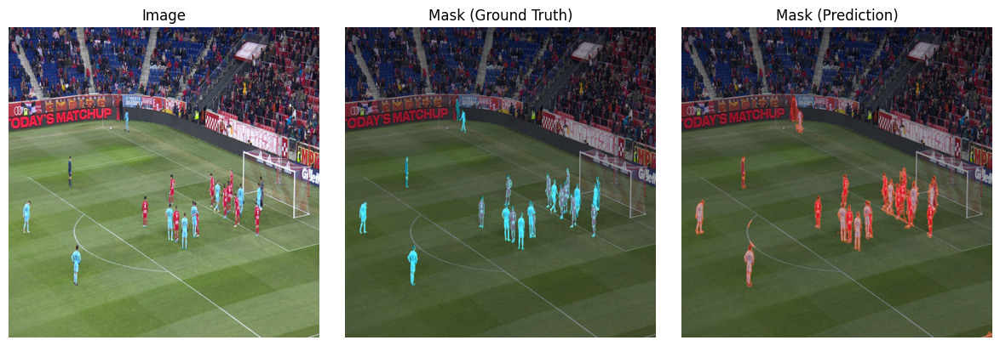

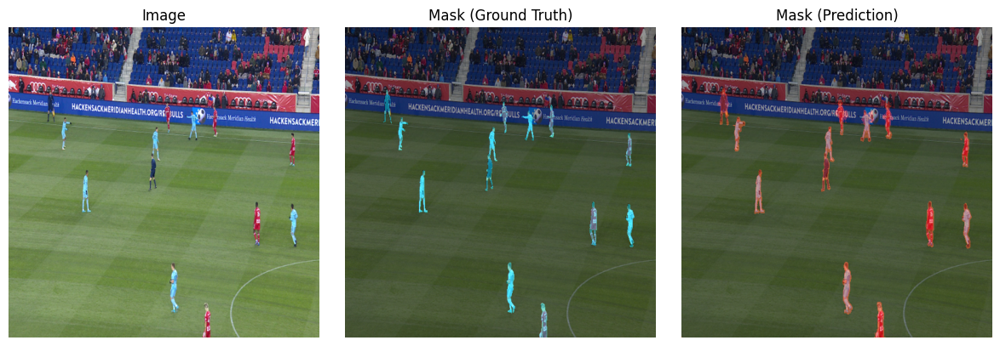

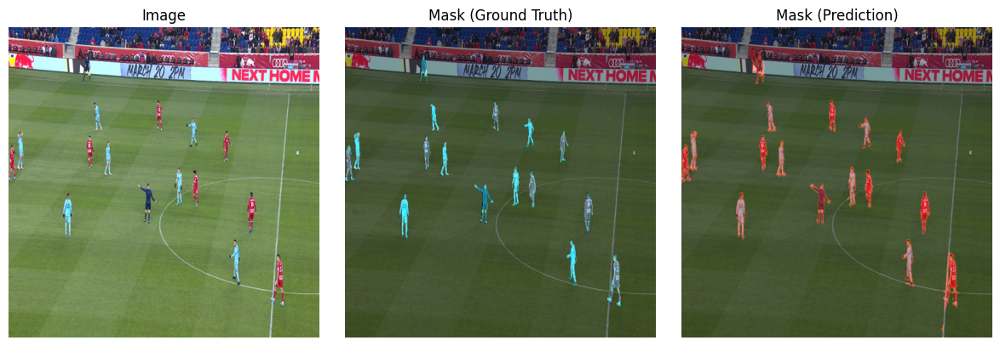

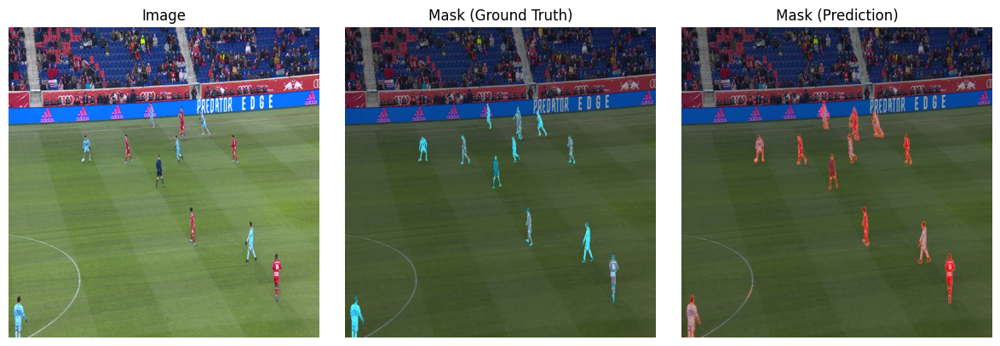

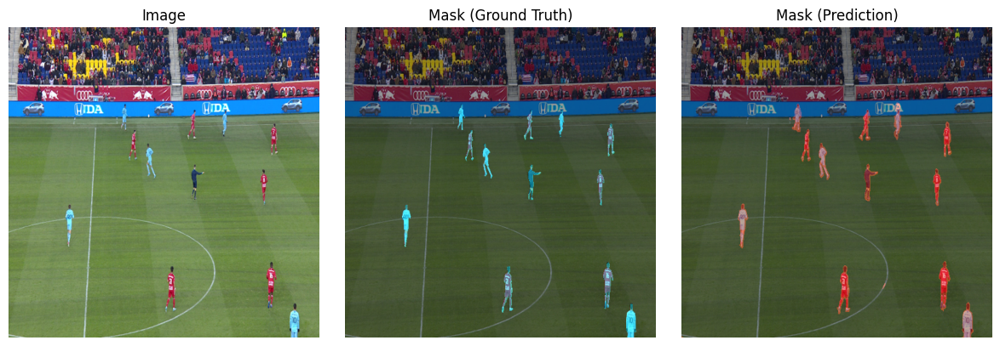

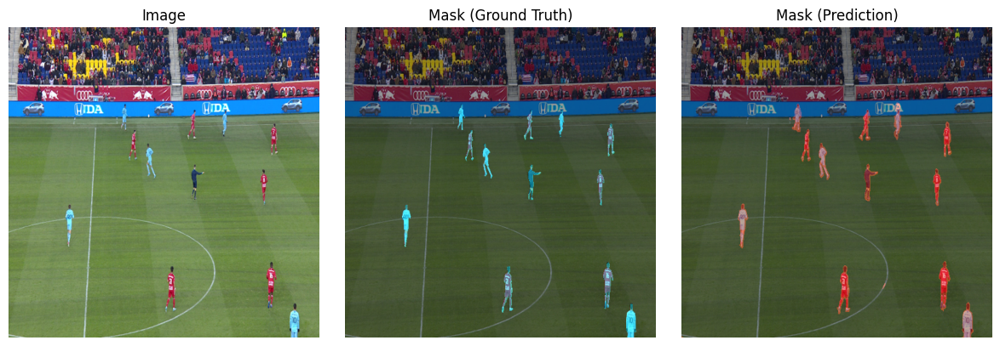

In [14]:
# Retrieve one batch (imgs, msks) from validation data
imgs, msks = val_data.__getitem__(3)

# Ensure we don't exceed the batch size
num_to_show = min(10, len(imgs))  

for i in range(num_to_show):
    # Extract the i-th image and mask from the batch
    img = imgs[i]
    msk = msks[i]
    
    # Expand dims to feed into the model for prediction
    pred = model.predict(np.expand_dims(img, axis=0), verbose=0)
    
    # Convert model output to [0..255] uint8
    pred = (np.squeeze(pred) * 255).astype(np.uint8)
    
    # Convert the original image and mask to [0..255] uint8
    img_uint8 = (img * 255).astype(np.uint8)
    msk_uint8 = (msk * 255).astype(np.uint8)
    
     # Check if the image is grayscale (1 channel), then convert to 3 channels (RGB)
    if img_uint8.ndim == 2:  # Grayscale image
        img_rgb = cv2.cvtColor(img_uint8, cv2.COLOR_GRAY2RGB)
    else:  # RGB image, no conversion needed
        img_rgb = img_uint8

    # Check if the mask is grayscale (1 channel), then convert to 3 channels (RGB)
    if msk_uint8.ndim == 2:  # Grayscale mask
        msk_rgb = cv2.cvtColor(msk_uint8, cv2.COLOR_GRAY2RGB)
    else:  # RGB mask, no conversion needed
        msk_rgb = msk_uint8

    # If you need to ensure prediction is in RGB format (it might be grayscale initially):
    if pred.ndim == 2:  # Grayscale prediction
        pred_rgb = cv2.cvtColor(pred, cv2.COLOR_GRAY2RGB)
    else:  # RGB prediction, no conversion needed
        pred_rgb = pred
    
    # Create a figure for each sample
    plt.figure(figsize=(12, 4))
    
    plt.subplot(131)
    plt.imshow(img_rgb)
    plt.title('Image')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)
    
    plt.subplot(132)
    # get_colored_mask is assumed to overlay a colored mask on the image
    plt.imshow(get_colored_mask(img_rgb, msk_rgb))
    plt.title('Mask (Ground Truth)')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)
    
    plt.subplot(133)
    # Show the prediction overlay in a different color if desired
    plt.imshow(get_colored_mask(img_rgb, pred_rgb, color=[255, 30, 0]))
    plt.title('Mask (Prediction)')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)
    
    plt.tight_layout()
    plt.show()

6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 625ms/step - accuracy: 0.9978 - dice_coefficient: 0.9207 - jaccard_index: 0.8530 - loss: 0.0053


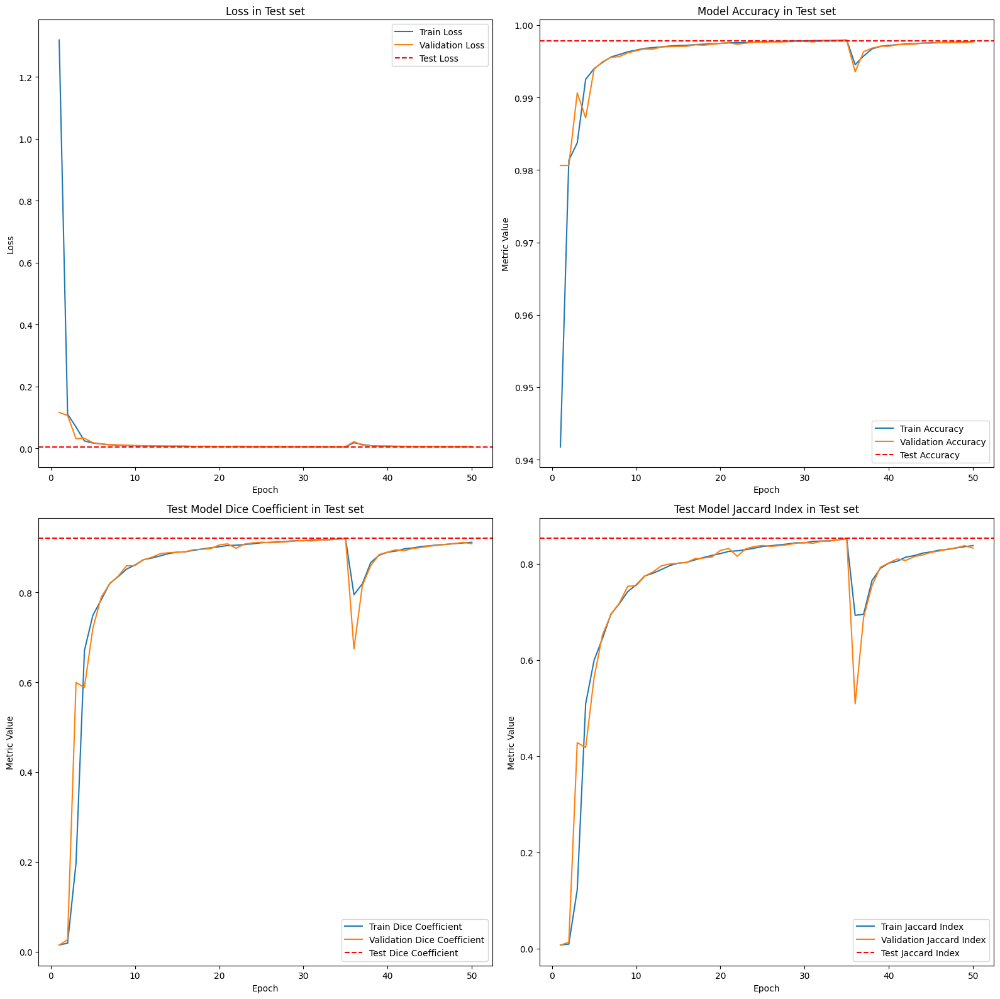

In [15]:
# Evaluate the model on test data
test_metrics = model.evaluate(test_data, verbose=1) 
test_loss, test_accuracy, test_dice, test_jaccard = test_metrics

epochs = range(1, len(history.history['loss']) + 1)

plt.figure(figsize=(16,16))
# Loss
plt.subplot(221)
plt.plot(epochs, history.history['loss'], label='Train Loss')
plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
plt.axhline(test_loss, color='r', linestyle='--', label='Test Loss')
plt.legend(loc='upper right')
plt.title('Loss in Test set')
plt.ylabel('Loss')
plt.xlabel('Epoch')

# Accuracy
plt.subplot(222)
plt.plot(epochs, history.history['accuracy'], label='Train Accuracy')
plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
plt.axhline(test_accuracy, color='r', linestyle='--', label='Test Accuracy') 
plt.legend(loc='lower right')
plt.title('Model Accuracy in Test set')
plt.ylabel('Metric Value')
plt.xlabel('Epoch')

# Dice Coefficient
plt.subplot(223)
plt.plot(epochs, history.history['dice_coefficient'], label='Train Dice Coefficient')
plt.plot(epochs, history.history['val_dice_coefficient'], label='Validation Dice Coefficient')
plt.axhline(test_dice, color='r', linestyle='--', label='Test Dice Coefficient') 
plt.legend(loc='lower right')
plt.title('Test Model Dice Coefficient in Test set')
plt.ylabel('Metric Value')
plt.xlabel('Epoch')

# Jaccard Index
plt.subplot(224)
plt.plot(epochs, history.history['jaccard_index'], label='Train Jaccard Index')
plt.plot(epochs, history.history['val_jaccard_index'], label='Validation Jaccard Index')
plt.axhline(test_jaccard, color='r', linestyle='--', label='Test Jaccard Index') 
plt.legend(loc='lower right')
plt.title('Test Model Jaccard Index in Test set')
plt.ylabel('Metric Value')
plt.xlabel('Epoch')

plt.tight_layout()
plt.show()

# Visualize Test Segmentation Output

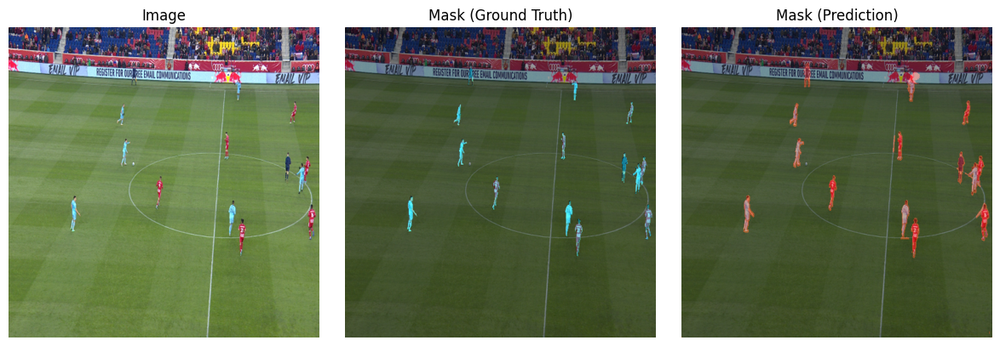

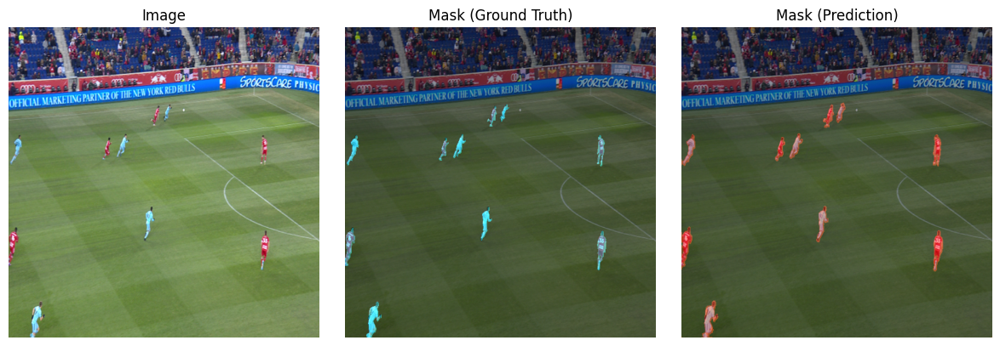

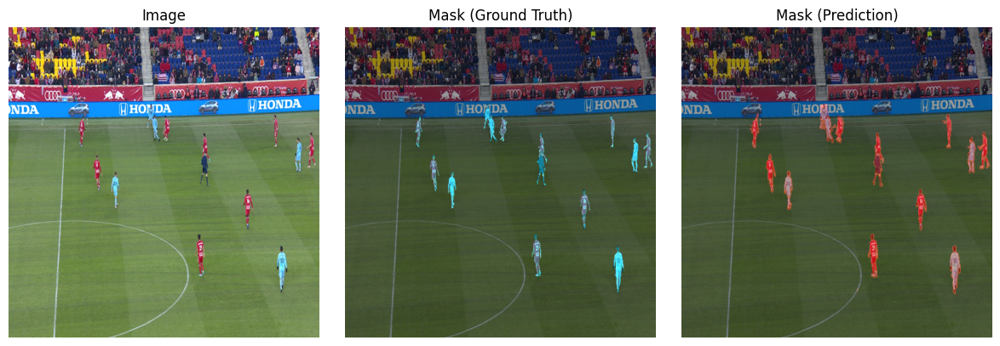

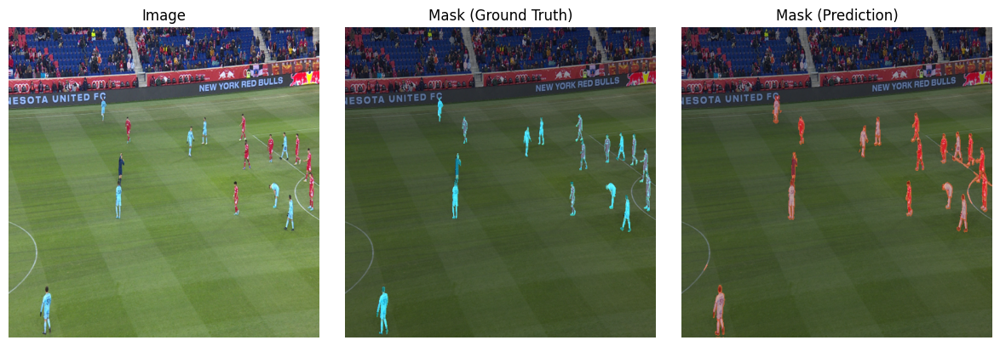

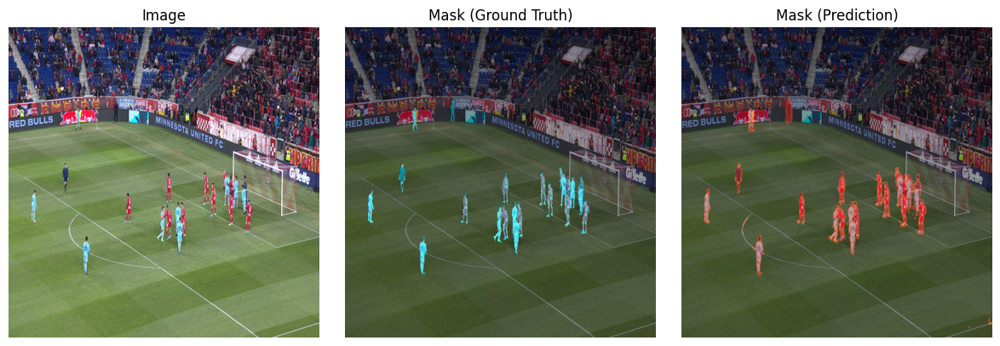

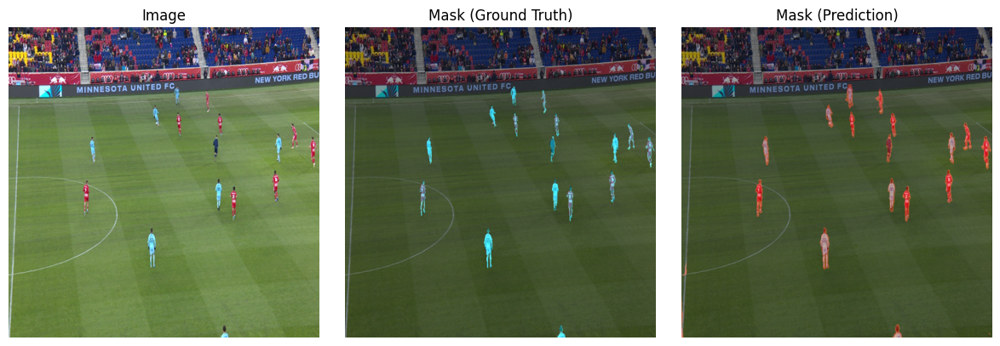

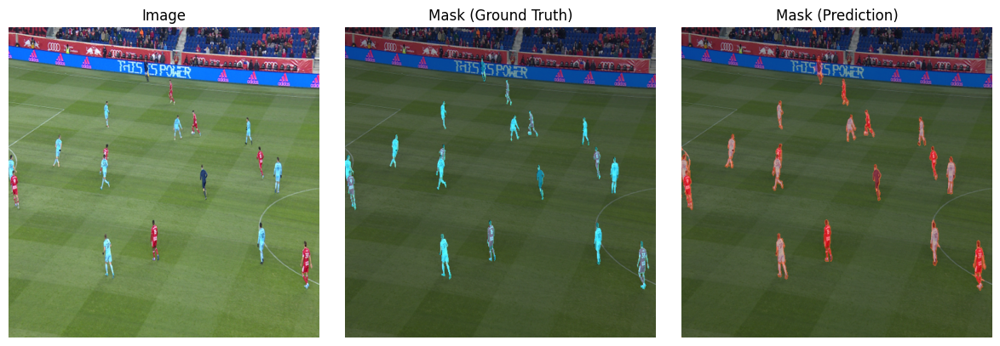

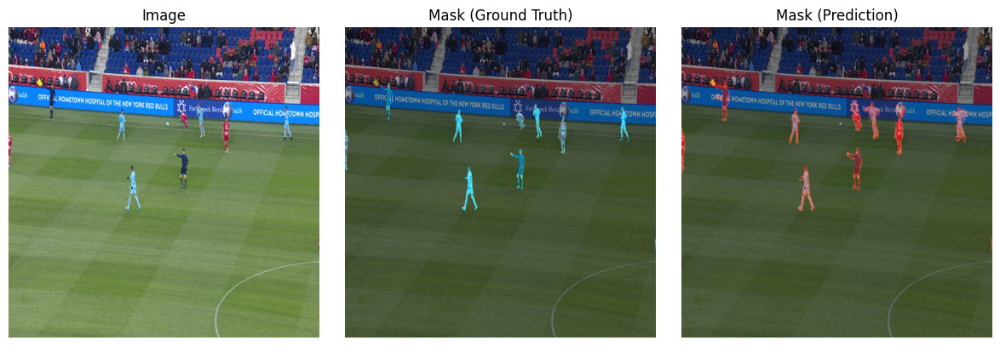

In [16]:
def convert_to_rgb(img):
    if img.ndim == 2 or img.shape[2] == 1:
        return cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    return img 
# Retrieve one batch (imgs, msks) from test data
imgs, msks = test_data.__getitem__(3)

# Ensure we don't exceed the batch size
num_to_show = min(10, len(imgs))  

for i in range(num_to_show):
    # Extract the i-th image and mask from the batch
    img = imgs[i]
    msk = msks[i]
    
    # Expand dims to feed into the model for prediction
    pred = model.predict(np.expand_dims(img, axis=0), verbose=0)
    
    # Convert model output to [0..255] uint8
    pred = (np.squeeze(pred) * 255).astype(np.uint8)
    
    # Convert the original image and mask to [0..255] uint8
    img_uint8 = (img * 255).astype(np.uint8)
    msk_uint8 = (msk * 255).astype(np.uint8)
    
    # Convert to 3-channel (RGB) if needed
    img_rgb = convert_to_rgb(img_uint8)  
    msk_rgb = convert_to_rgb(msk_uint8)
    pred_rgb = convert_to_rgb(pred)
    
    # Create a figure for each sample
    plt.figure(figsize=(12, 4))
    
    plt.subplot(131)
    plt.imshow(img_rgb)
    plt.title('Image')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)
    
    plt.subplot(132)
    # get_colored_mask is assumed to overlay a colored mask on the image
    plt.imshow(get_colored_mask(img_rgb, msk_rgb))
    plt.title('Mask (Ground Truth)')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)
    
    plt.subplot(133)
    # Show the prediction overlay in a different color if desired
    plt.imshow(get_colored_mask(img_rgb, pred_rgb, color=[255, 30, 0]))
    plt.title('Mask (Prediction)')
    plt.yticks([])
    plt.xticks([])
    plt.box(False)
    
    plt.tight_layout()
    plt.show()